In [1]:
# add path to ssa package
import sys
sys.path.append('../../..')

In [2]:
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import pathlib
import cvxpy as cv

import pickle
from time import time
import re

%matplotlib inline 

In [3]:
# tssa model
from src.ssa_methods.t_ssa import t_SSA

# plot with large fonts and other stuff
from src.plot.journal_style import EnableJournalStylePlotting

# data extraction methods
from src.data.accelerometer import GetMotionData

# partition finding algorithms
from src.ssa_methods.ssa_complementary.ssa_multidim_partition import NextDichotomyPartition

## Data preprocessing

In [4]:
# names of observed signals
sig_names = ['$a_x$', '$a_y$', '$a_z$', '$w_x$', '$w_y$', '$w_z$']
# measure units
# acceleration is in g-units (g=9.8)
sig_units = ["g", "g", "g", "rad/s", "rad/s", "rad/s"]

num_signals = 6

In [5]:
# retrive signals and corresponding time grids
# this is walking motion
# first 3 components = accelerometer, last 3 - gyroscope
(train_data, time_grid_train), (test_data, time_grid_test) = GetMotionData()

print("Train len = ", train_data.shape[0])
print("Test len = ", test_data.shape[0])

Train len =  2460
Test len =  540


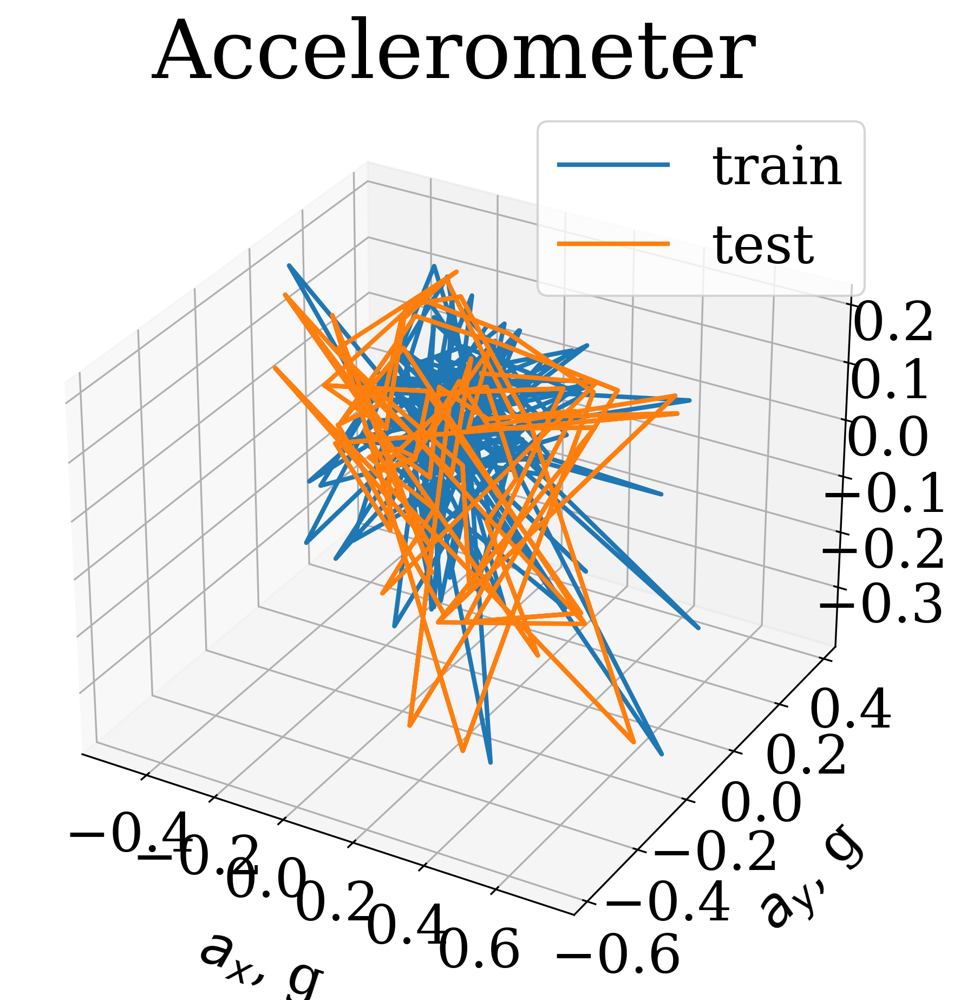

In [19]:
# draw accelerometer signals
with EnableJournalStylePlotting():
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(projection='3d')
    
    train_points = train_data.T[:3, ::20]
    test_points = test_data.T[:3, ::4]
    
    ax.plot(*train_points, label="train")
    ax.plot(*test_points, label="test")
    
    ax.set_xlabel(f"{sig_names[0]}, {sig_units[0]}", labelpad=21)
    ax.set_ylabel(f"{sig_names[1]}, {sig_units[1]}", labelpad=21)
    ax.set_zlabel(f"{sig_names[2]}, {sig_units[2]}", labelpad=21)
    ax.set_title("Accelerometer")
    ax.legend()
    
    fig.savefig("../../../figs/acceleromter.png", format='png')

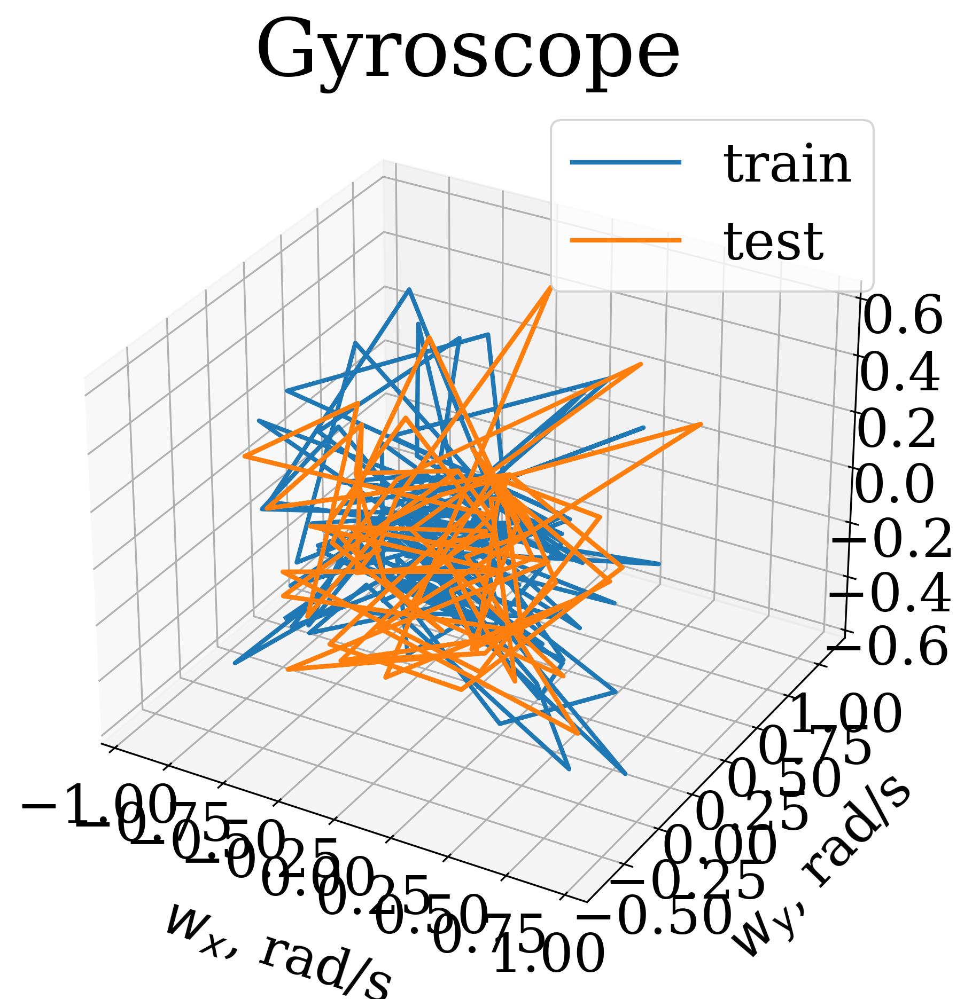

In [20]:
# draw gyro signals
with EnableJournalStylePlotting():
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(projection='3d')

    train_points = train_data.T[3:, ::20]
    test_points = test_data.T[3:, ::4]

    ax.plot(*train_points, label="train")
    ax.plot(*test_points, label="test")

    ax.set_xlabel(f"{sig_names[3]}, {sig_units[3]}", labelpad=21)
    ax.set_ylabel(f"{sig_names[4]}, {sig_units[4]}", labelpad=21)
    ax.set_zlabel(f"{sig_names[5]}, {sig_units[5]}", labelpad=21)
    ax.set_title("Gyroscope")
    ax.legend()

    fig.savefig("../../../figs/gyro.png", format='png')

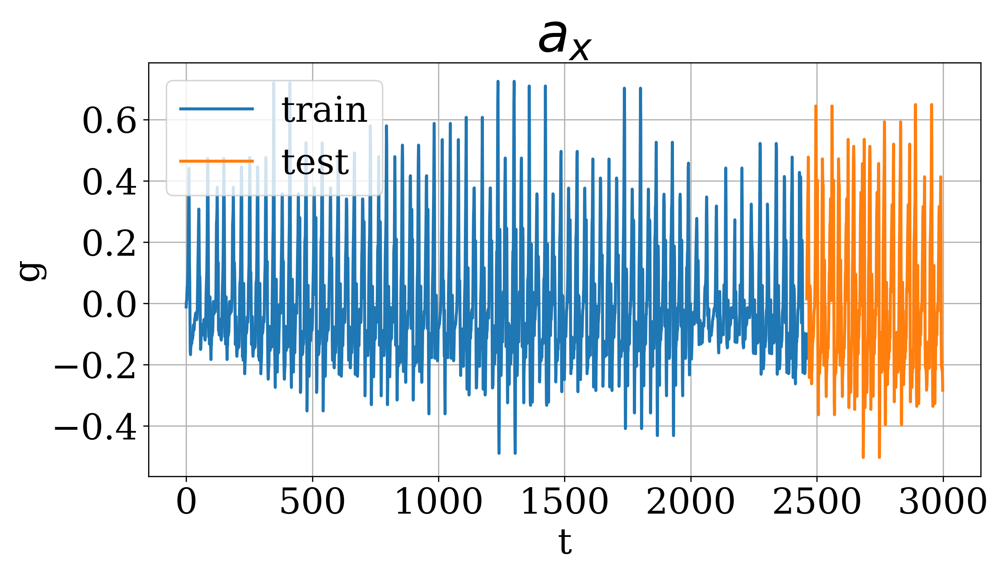

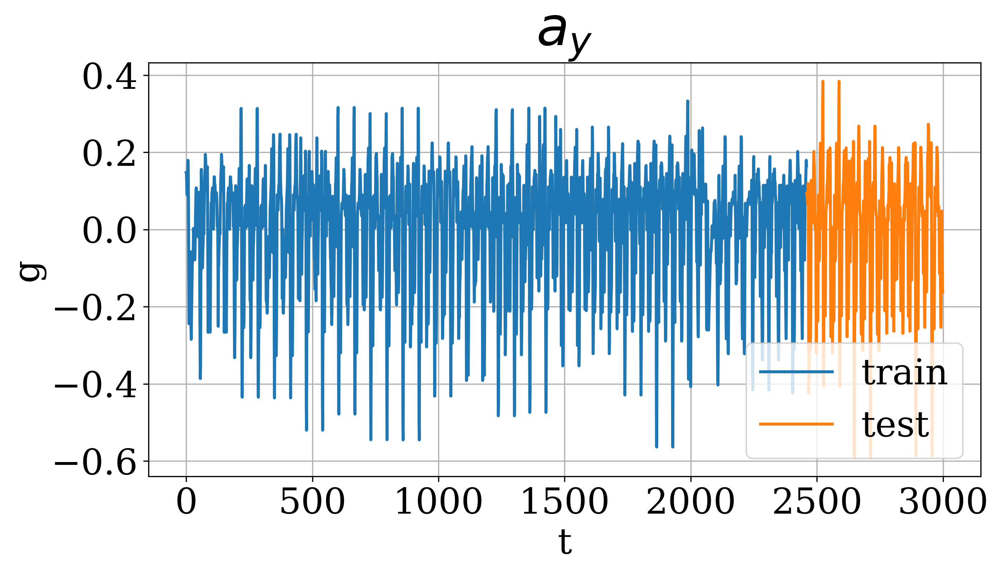

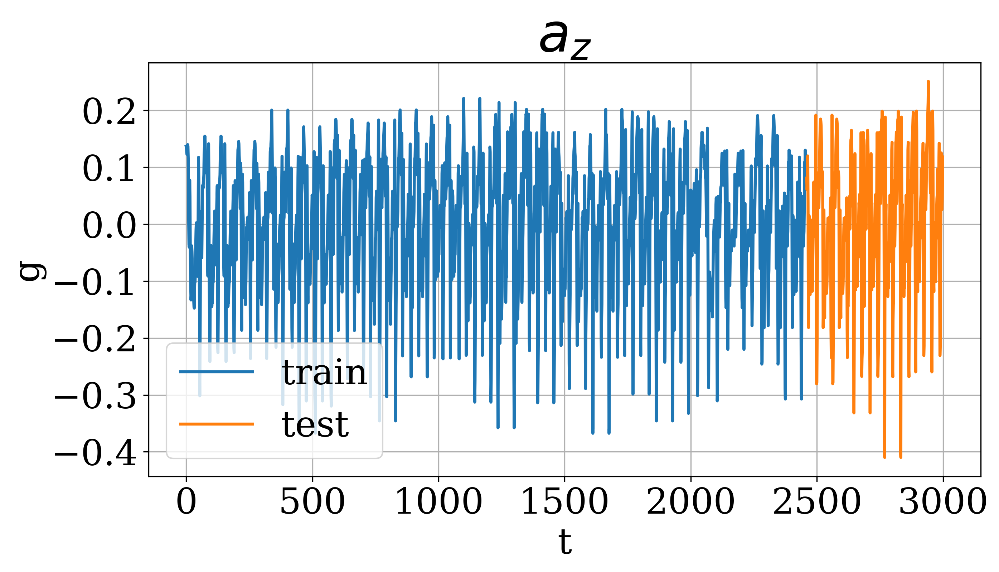

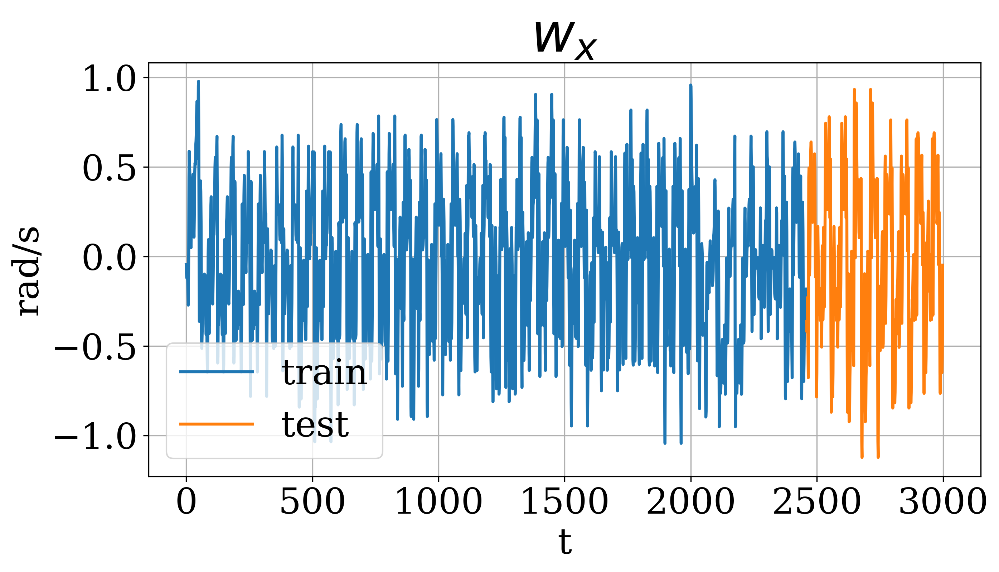

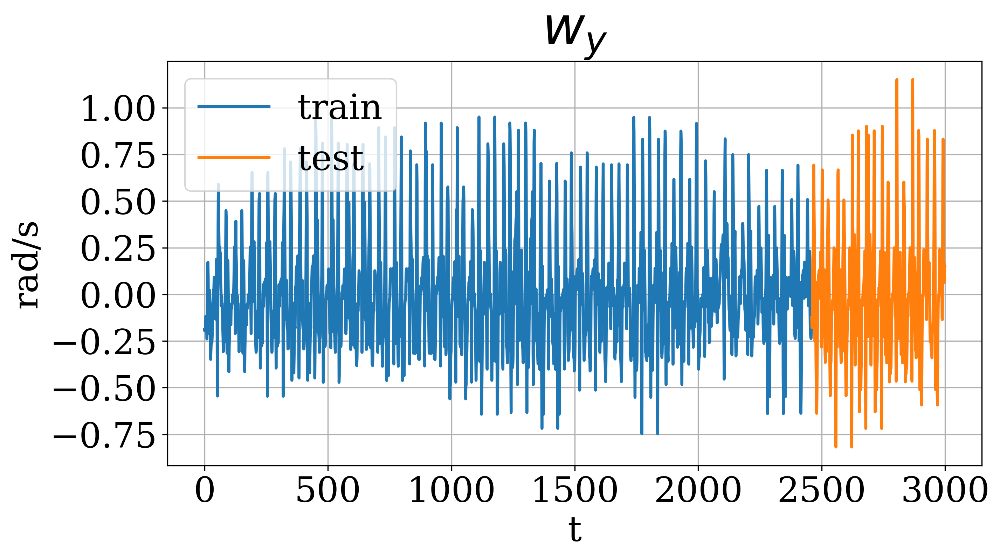

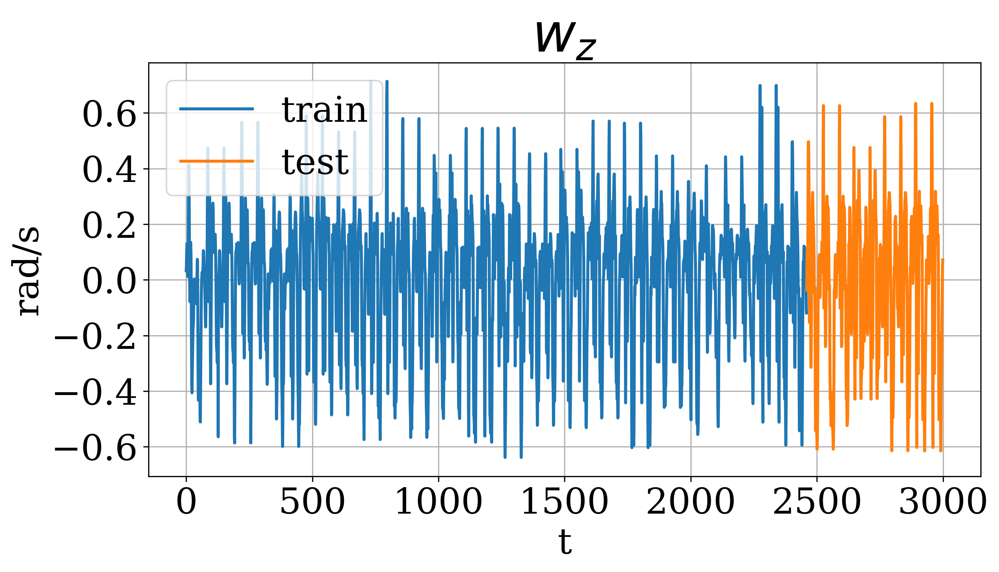

In [44]:
# draw signals
for i in range(num_signals):
    with EnableJournalStylePlotting():
        fig, ax = plt.subplots(figsize=(10, 5))

        ax.plot(time_grid_train, train_data.T[i], label='train')
        ax.plot(time_grid_test, test_data.T[i], label='test')

        ax.grid(True)
        ax.legend()
        ax.set_xlabel('t')
        ax.set_ylabel(sig_units[i])
        ax.set_title(sig_names[i])

        fig.savefig(f"../../../figs/{sig_names[i]}.png", format='png')

## Global method parameters

In [20]:
# aka L parameter
ssa_window_size = 500

cpd_ranks = np.arange(5, 40 + 1, 5)
# container for RHE metrics
RHE_results = {}

group_results = {}

# cut the size of the ILS system
max_col_size = 500

# random seed
SEED = 42

In [25]:
# colours for our signals (https://colorhunt.co/palette/808836ffbf00ff9a00d10363)
color_list = ['#808836', '#FFBF00', '#FF9A00', "#D10363", "#6C0345", "#DC6B19"]

In [11]:
# backup directory
pathlib.Path(f"saved_model/").mkdir(exist_ok=True)

In [ ]:
for cpd_rank in cpd_ranks:
    print(f"CPD-rank = {cpd_rank}")

    t_ssa_obj = t_SSA(ssa_window_size, train_data.T, cpd_rank)
    t_ssa_obj.decompose_tt(random_state=SEED)

    group_results[cpd_rank] = []

    num_signals = len(t_ssa_obj.t_s_list)
    for sig_num in range(num_signals):
        print(f"Signal {sig_num}")

        column_list = []

        weights, left_factors, right_factors = t_ssa_obj.get_available_factors(sig_num)

        # construct ILS system
        # get all factors except last
        for i in range(weights.shape[0] - 1):
            # compute residual matrix and cut its size
            factor_matrix = weights[i] * np.outer(left_factors[:, i], right_factors[i, :])
            hankelized_factor = factor_matrix.copy(); t_ssa_obj._hankelize_matrix(hankelized_factor)
            resid_matrix = factor_matrix - hankelized_factor

            column_list.append(
                resid_matrix.reshape(-1, 1)[:max_col_size]
            )

        ils_matrix = np.concatenate(column_list, axis=1)

        # CVXPY problem statement
        beta = cv.Variable(ils_matrix.shape[1], boolean=True)
        constraint = [cv.sum(beta) >= 2]
        obj = cv.Minimize(cv.norm(ils_matrix @ beta))
        problem = cv.Problem(obj, constraint)

        solve_time = time()
        problem.solve(solver="SCIP")
        solve_time = time() - solve_time

        print("solve time", solve_time)
        print("status:", problem.status)
        print("optimal value", problem.value)
        print("optimal beta", np.round(beta.value))

        # setting factors
        beta.value = np.round(beta.value).astype(np.int32)
        group_1 = np.argwhere(beta.value).flatten().tolist()
        group_2 = list(set(range(cpd_rank)) - set(group_1))

        group_results[cpd_rank].append([group_1, group_2])

        t_ssa_obj.set_factors_grouping([group_1, group_2], sig_num)

    # compute decomposition
    comp_sigs, hank_resid_abs, hank_resid_rel = t_ssa_obj.decompose_signals()

    RHE_results.update({
        cpd_rank: hank_resid_rel
    })

    # view and save relative hankerlization errors
    for i in range(train_data.shape[1]):
        print(f'RHE for {sig_names[i]}: {hank_resid_rel[i]}; Mean_ts_RHE = {np.mean(hank_resid_rel[i])}')
    print(f"Mean RHE for data = {np.mean(np.array(RHE_results[cpd_rank]))}")

    with open(f"saved_model/cpd_rank_{cpd_rank}.pkl", "wb") as f:
        pickle.dump(t_ssa_obj, f)

    print("\n")

In [13]:
# store existing data
with open("./saved_model/full_search_data.pkl", "wb") as f:
    if re.search("[Y,y]", input("Do you want rewrite existing data in storage?")) != None:
        pickle.dump([RHE_results, group_results], f)

In [22]:
# load existing data
if pathlib.Path("./saved_model/full_search_data.pkl").exists():
    with open("./saved_model/full_search_data.pkl", "rb") as f:
        if re.search("[Y,y]", input("Do you want use existing data from storage?")) != None:
            RHE_results, group_results = pickle.load(f)

In [23]:
print(RHE_results[10])
print(list(map(np.mean, RHE_results[10])))

[array([0.20880433, 0.21751182]), array([0.2818536 , 0.21135649]), array([0.19622954, 0.26575665]), array([0.19631033, 0.42855381]), array([0.21719514, 0.28546498]), array([0.21943704, 0.23518136])]
[0.2131580755084403, 0.2466050481648307, 0.23099309443672136, 0.3124320698538391, 0.251330058796029, 0.22730920273146044]


In [23]:
rhe_means = []
for key, value in RHE_results.items():
    rhe_means.append(
        np.mean(np.array(value))
    )

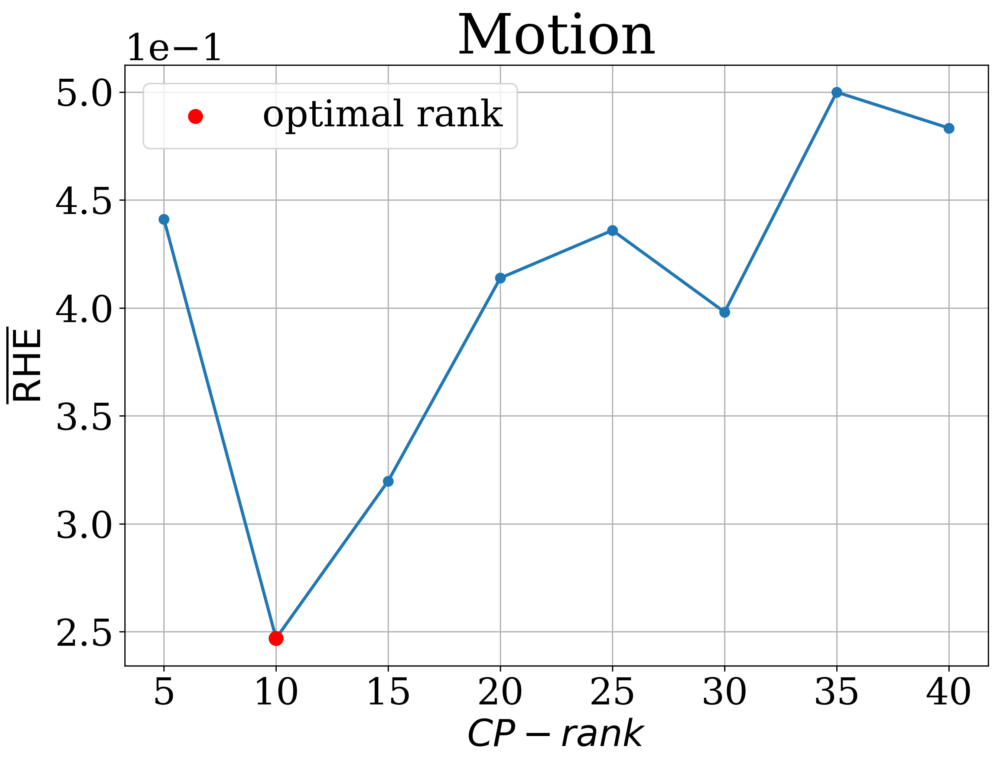

In [27]:
# plot mean RHE

with EnableJournalStylePlotting():
    fig, ax = plt.subplots(figsize=(10, 7))

    ax.plot(cpd_ranks, rhe_means, marker=".")
    ax.scatter([10], [rhe_means[1]], marker=".", s=300, c="red", label="optimal rank", zorder=10)
    
    ax.legend()
    ax.grid(True)
    ax.set_ylabel(r"$ \overline{\text{RHE}} $")
    ax.set_xlabel('$CP-rank$')
    ax.set_title("Motion")

    ax.set_xticks(cpd_ranks)
    ax.ticklabel_format(axis="y", style="scientific", scilimits=(0, 0))

    pathlib.Path(f"figs/decomposition").mkdir(exist_ok=True, parents=True)
    fig.savefig("./figs/decomposition/RHE_mean.png", format="png")

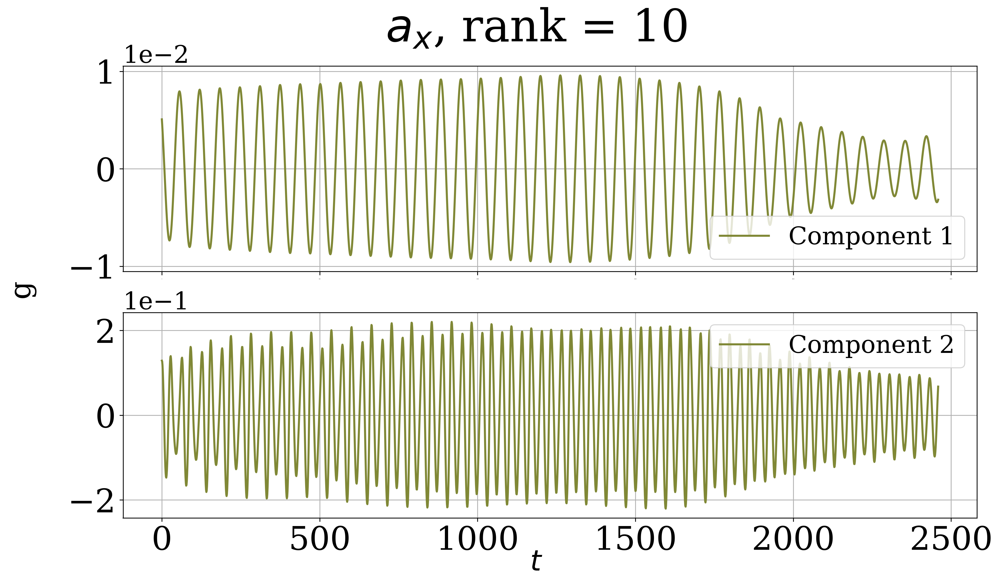

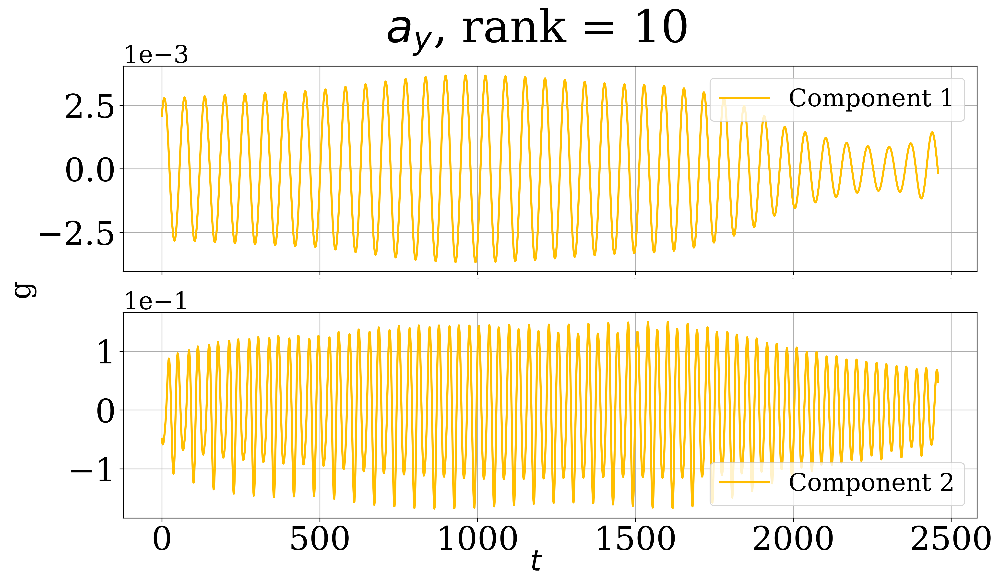

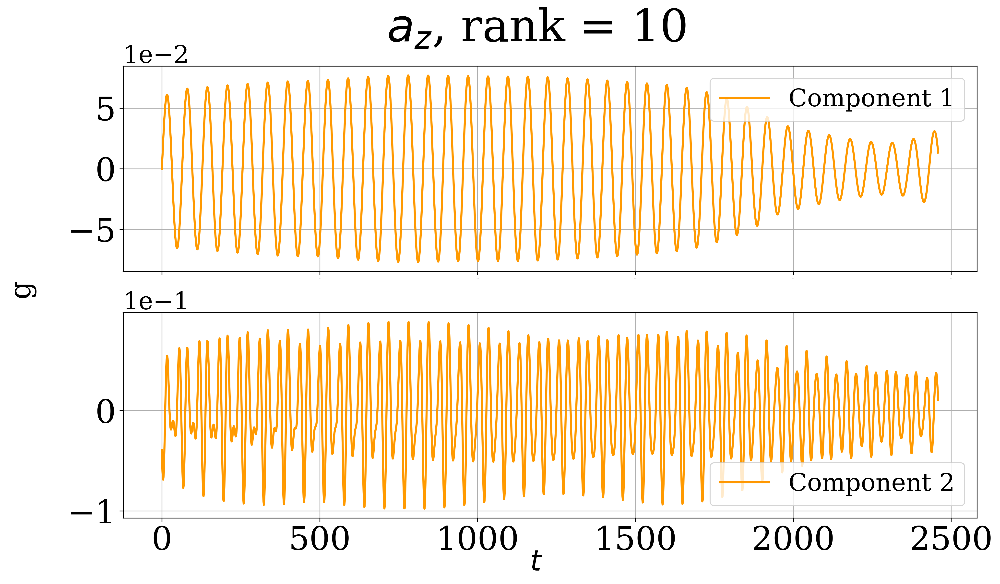

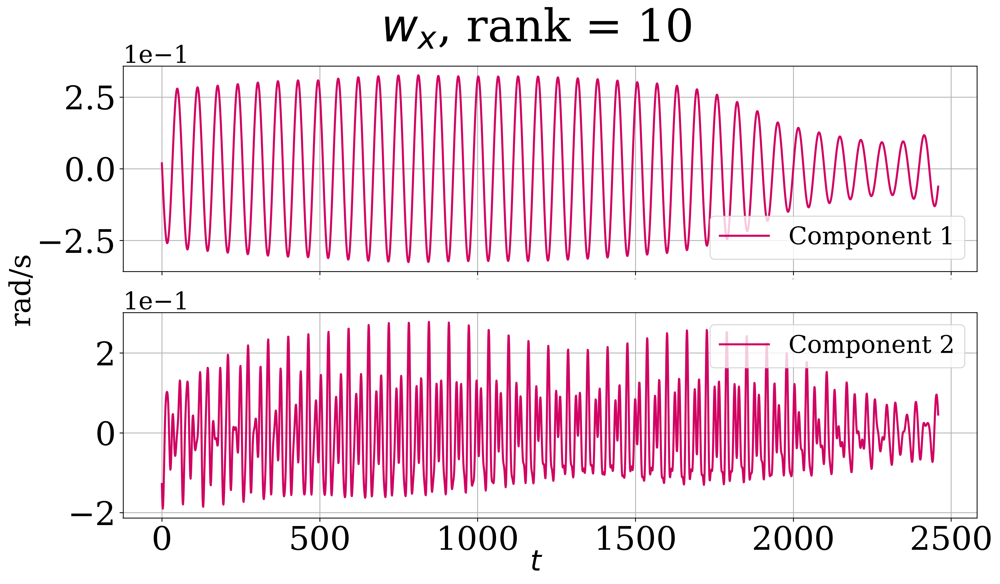

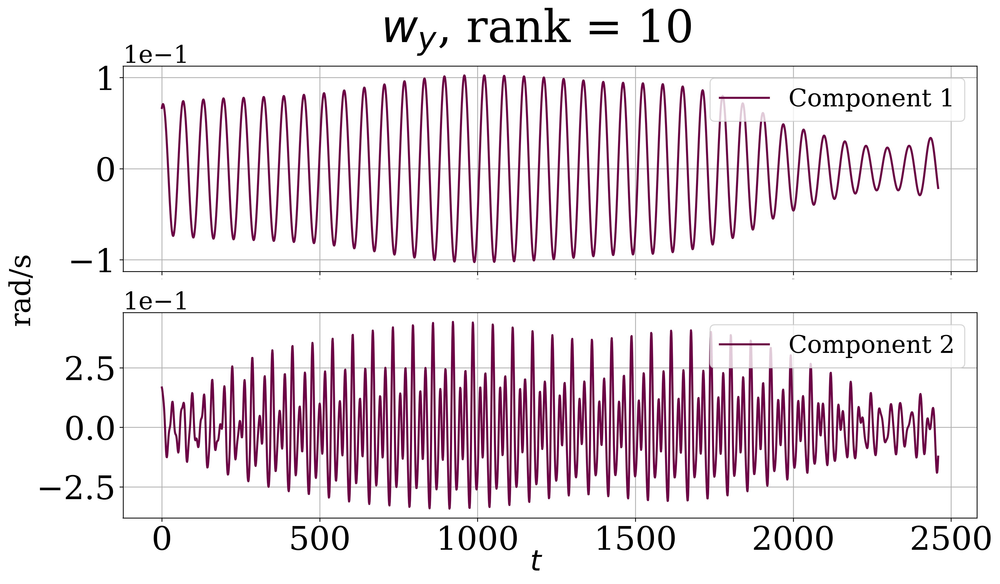

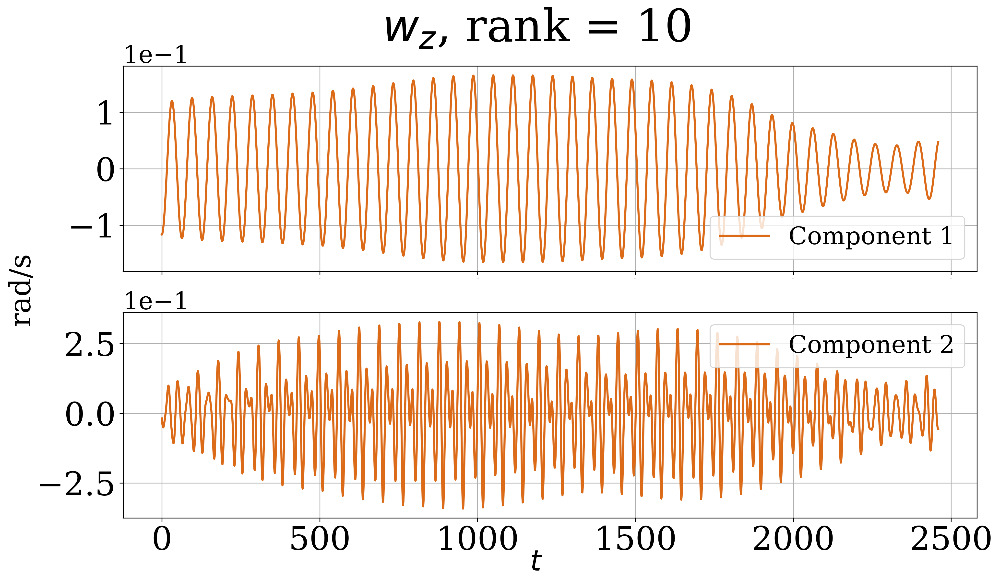

In [27]:
with open("./saved_model/cpd_rank_10.pkl", "rb") as f:
    t_ssa_obj = pickle.load(f)

num_signals = len(t_ssa_obj.t_s_list)
for sig_num in range(num_signals):
    t_ssa_obj.set_factors_grouping(group_results[10][sig_num], sig_num)

# compute decomposition
comp_sigs, hank_resid_abs, hank_resid_rel = t_ssa_obj.decompose_signals()

pathlib.Path("./figs/decomposition/cpd_rank_10/").mkdir(exist_ok=True, parents=True)
# plot results
for i in range(train_data.shape[1]):
    with EnableJournalStylePlotting():
        fig, axs = plt.subplots(nrows=len(comp_sigs[i]), ncols=1, figsize=(15, 8))

        for j in range(len(comp_sigs[i])):
            axs[j].plot(time_grid_train, comp_sigs[i][j], label=f'Component {j + 1}', color=color_list[i])

            axs[j].tick_params(axis='y', labelsize=32, )
            if j != len(comp_sigs[i]) - 1:
                axs[j].tick_params(axis='x', labelsize=0)
            else:
                axs[j].tick_params(axis='x', labelsize=32)

            axs[j].grid(True)
            axs[j].legend()

            axs[j].ticklabel_format(axis="y", style="scientific", scilimits=(0, 0))

        fig.supylabel(f'{sig_units[i]}', fontsize=28)
        fig.supxlabel('$t$', fontsize=28)
        fig.suptitle(f'{sig_names[i]}, rank = 10', fontsize=44)

        fig.savefig(f"./figs/decomposition/cpd_rank_10/{sig_names[i]}.png", format="png")

In [50]:
rhe_array = np.vstack(hank_resid_rel)
rhe_array = np.mean(rhe_array, axis=1)

print("RHE accel", np.mean(rhe_array[:3]))
print("RHE gyro", np.mean(rhe_array[3:]))

RHE accel 0.23025207270333078
RHE gyro 0.26369044379377615


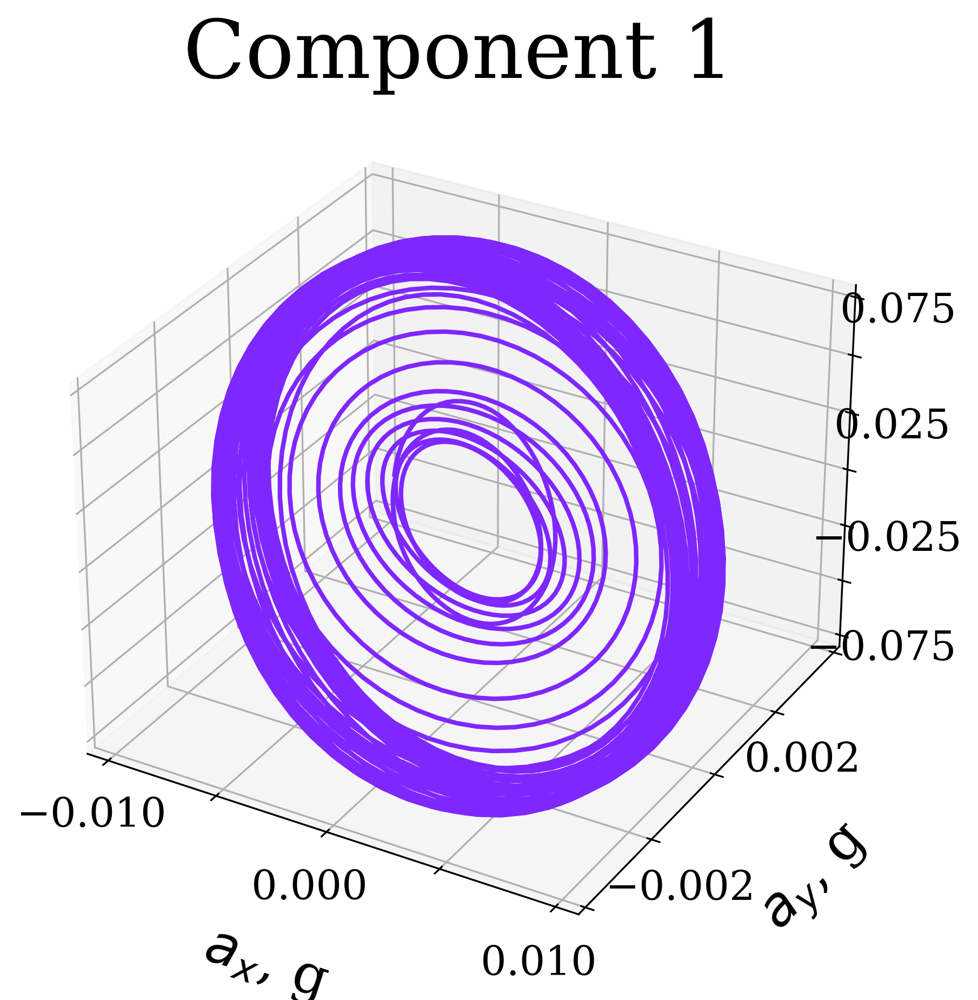

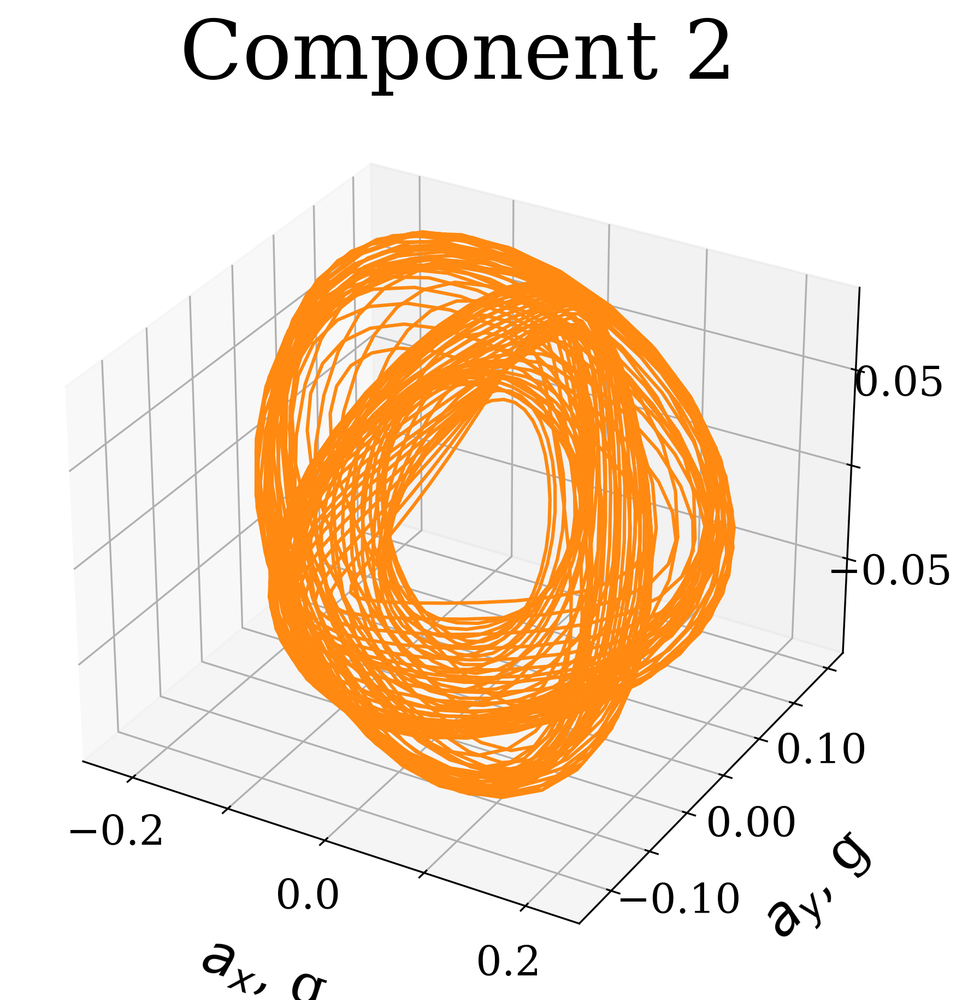

In [47]:
# plot 3d acceler results
component_colors = ["#7F27FF", "#FF8911"]

with EnableJournalStylePlotting():
    num_components = len(comp_sigs[0])
    for j in range(num_components):
        fig = plt.figure(figsize=(10, 7))
        ax = fig.add_subplot(projection='3d')

        component_points = np.array([comp_sigs[0][j], comp_sigs[1][j], comp_sigs[2][j]])
        #component_points = component_points[:, :50]

        if j == 0:
            ax.plot(*component_points, color=component_colors[j])
        if j == 1:
            ax.plot(*component_points, color=component_colors[j], linewidth=1.5)

        ax.set_xlabel(f"{sig_names[0]}, {sig_units[0]}", labelpad=21)
        ax.set_ylabel(f"{sig_names[1]}, {sig_units[1]}", labelpad=21)
        ax.set_zlabel(f"{sig_names[2]}, {sig_units[2]}", labelpad=21)
        ax.set_title(f"Component {j + 1}")

        for axis in ["x", "y", "z"]:
            #ax.ticklabel_format(axis=axis, style="scientific", scilimits=(0, 0))
            ax.tick_params(axis=axis, labelsize=18)

        for index, label in enumerate(ax.xaxis.get_ticklabels()):
            if index % 2 == 0:
                label.set_visible(False)
        for index, label in enumerate(ax.yaxis.get_ticklabels()):
            if index % 2 != 0:
                label.set_visible(False)
        for index, label in enumerate(ax.zaxis.get_ticklabels()):
            if index % 2 == 0:
                label.set_visible(False)
        
        fig.savefig(f"./figs/decomposition/cpd_rank_10/acceler_{j + 1}.png", format='png')

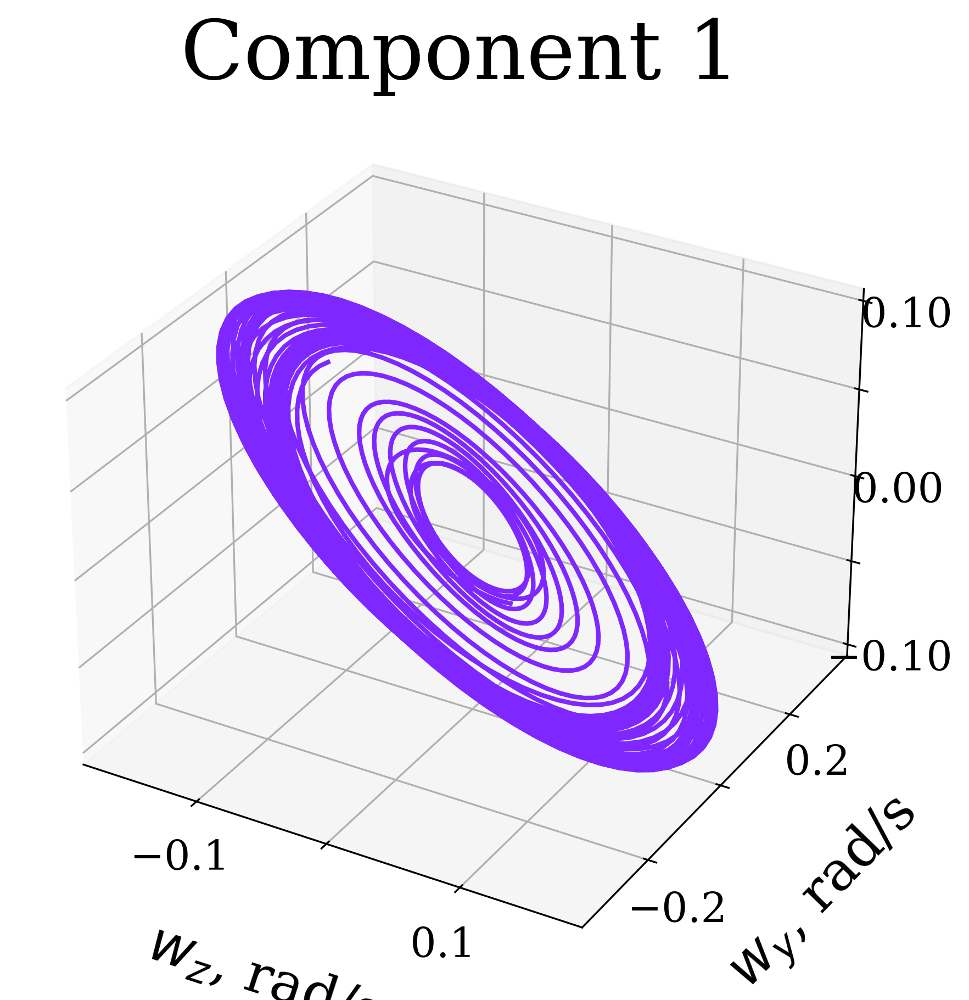

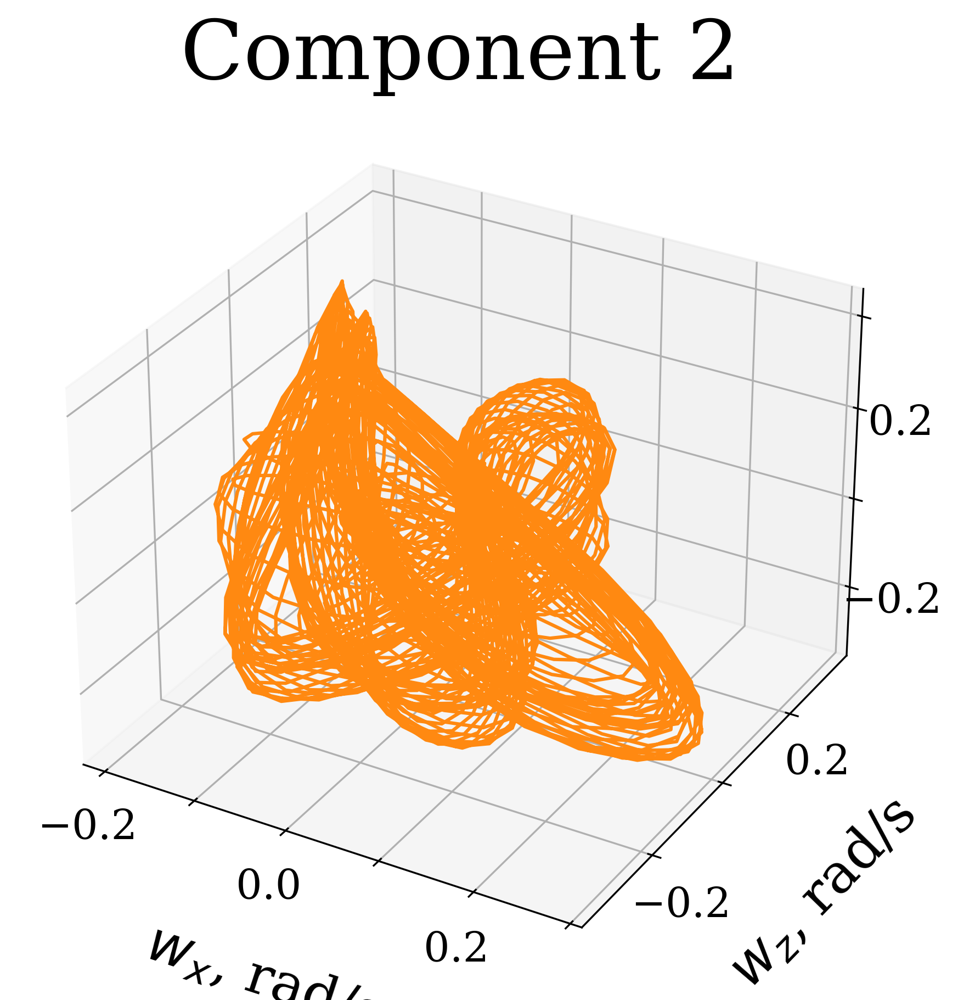

In [48]:
# plot 3d gyro results
component_colors = ["#7F27FF", "#FF8911"]

with EnableJournalStylePlotting():
    num_components = len(comp_sigs[0])
    for j in range(num_components):
        fig = plt.figure(figsize=(10, 7))
        ax = fig.add_subplot(projection='3d')

        component_points = np.array([comp_sigs[3][j], comp_sigs[4][j], comp_sigs[5][j]])
        #component_points = component_points[:, :50]

        if j == 0:
            ax.plot(*component_points, zdir="x", color=component_colors[j])

            ax.set_xlabel(f"{sig_names[5]}, {sig_units[5]}", labelpad=21)
            ax.set_ylabel(f"{sig_names[4]}, {sig_units[4]}", labelpad=21)
            ax.set_zlabel(f"{sig_names[3]}, {sig_units[3]}", labelpad=21)
            ax.set_title(f"Component {j + 1}")
        if j == 1:
            ax.plot(*component_points, zdir="y", color=component_colors[j], linewidth=1.5)

            ax.set_xlabel(f"{sig_names[3]}, {sig_units[3]}", labelpad=21)
            ax.set_ylabel(f"{sig_names[5]}, {sig_units[5]}", labelpad=21)
            ax.set_zlabel(f"{sig_names[4]}, {sig_units[4]}", labelpad=21)
            ax.set_title(f"Component {j + 1}")

        for axis in ["x", "y", "z"]:
            #ax.ticklabel_format(axis=axis, style="scientific", scilimits=(0, 0))
            ax.tick_params(axis=axis, labelsize=18)

        for index, label in enumerate(ax.xaxis.get_ticklabels()):
            if index % 2 == 0:
                label.set_visible(False)
        for index, label in enumerate(ax.yaxis.get_ticklabels()):
            if index % 2 == 0:
                label.set_visible(False)
        for index, label in enumerate(ax.zaxis.get_ticklabels()):
            if index % 2 == 0:
                label.set_visible(False)
        
        fig.savefig(f"./figs/decomposition/cpd_rank_10/gyro_{j + 1}.png", format='png')